In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier # brew install libomp
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

In [2]:
shared = pd.read_table("../data/baxter.0.03.subsample.shared")
meta = pd.read_table("../data/metadata.tsv")

In [14]:
meta = meta[['sample','Dx_Bin', 'Age', 'Gender', 'Smoke', 'Diabetic', 'BMI']]
meta['Gender'] = meta['Gender'].replace({'m': 1, 'f': 0})
meta['Diabetic'] = meta['Diabetic'].replace({np.nan: 1.0})
meta['Smoke'] = meta['Smoke'].replace({np.nan: 2.0})
meta['BMI'] = meta['BMI'].replace({np.nan: meta['BMI'].mean()})
## Rename the column name "Group" to match the "sample" in meta
shared = shared.rename(index=str, columns={"Group":"sample"})
## Merge the 2 datasets on sample
data=pd.merge(meta,shared,on=['sample'])
## Drop all except OTU columns for x
x = data.drop(["sample", 'Dx_Bin', "numOtus", "label", 'Diabetic'], axis=1)

y = data['Diabetic']
# y = np.eye(2, dtype='uint8')[y]
## Drop if NA elements
# y = y.dropna()
y= y.values
# x = x.dropna()

In [15]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42, stratify=y)

In [5]:
from sklearn.feature_selection import SelectKBest, f_classif# Example: Assuming 'label' column represents the clinical label you're interested in
XX = shared.drop(['label', 'sample', 'numOtus'], axis=1)  # Drop non-OTU columns to get only OTU features
y1 = meta['Diabetic']  # This is the clinical feature you're analyzing

In [6]:
# Perform feature selection
selector = SelectKBest(f_classif, k=50)  # Select top 50 features (you can adjust the number as needed)
X_new = selector.fit_transform(XX, y1)

# Get the columns selected
selected_columns = XX.columns[selector.get_support(indices=True)]

# Create a new DataFrame with the selected OTUs
reduced_otu_table = shared[selected_columns]

In [7]:
selected_columns

Index(['Otu00025', 'Otu00064', 'Otu00116', 'Otu00284', 'Otu00293', 'Otu00296',
       'Otu00358', 'Otu00432', 'Otu00444', 'Otu00465', 'Otu00473', 'Otu00476',
       'Otu00491', 'Otu00544', 'Otu00569', 'Otu00666', 'Otu00698', 'Otu00961',
       'Otu00964', 'Otu00979', 'Otu01040', 'Otu01069', 'Otu01126', 'Otu01262',
       'Otu01288', 'Otu01461', 'Otu01516', 'Otu01536', 'Otu01588', 'Otu01859',
       'Otu01879', 'Otu01918', 'Otu01945', 'Otu01961', 'Otu02063', 'Otu02110',
       'Otu02349', 'Otu02425', 'Otu02732', 'Otu02772', 'Otu02811', 'Otu02913',
       'Otu03113', 'Otu03168', 'Otu03216', 'Otu03304', 'Otu03320', 'Otu03324',
       'Otu03390', 'Otu05195'],
      dtype='object')

In [47]:
data.head(2)

,sample,Dx_Bin,Age,Gender,Smoke,Diabetic,BMI,label,numOtus,Otu00001,...,Otu11258,Otu11263,Otu11269,Otu11270,Otu11271,Otu11274,Otu11277,Otu11278,Otu11280,Otu11281
0,2003650,High Risk Normal,64,1,2.0,0.0,36.227509,0.03,6920,350,...,0,0,0,0,0,0,0,0,0,0
1,2005650,High Risk Normal,61,1,0.0,0.0,27.968016,0.03,6920,568,...,0,0,0,0,0,1,0,0,0,0


In [48]:
x

,Age,Gender,Smoke,BMI,Otu00001,Otu00002,Otu00003,Otu00004,Otu00005,Otu00006,...,Otu11258,Otu11263,Otu11269,Otu11270,Otu11271,Otu11274,Otu11277,Otu11278,Otu11280,Otu11281
0,64,1,2.0,36.227509,350,268,213,1,208,230,...,0,0,0,0,0,0,0,0,0,0
1,61,1,0.0,27.968016,568,1320,13,293,671,103,...,0,0,0,0,0,1,0,0,0,0
2,47,0,0.0,21.799308,151,756,802,556,145,271,...,0,0,0,0,0,0,0,0,0,0
3,81,0,1.0,23.030045,299,30,1018,0,25,99,...,0,0,0,0,0,0,0,0,0,0
4,44,0,0.0,24.913495,1409,174,0,3,2,1136,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,53,0,0.0,33.593750,393,451,111,1538,33,1126,...,0,0,0,0,0,0,0,0,0,0
486,75,1,1.0,27.173119,1755,23,1,1280,473,2182,...,0,0,0,0,0,0,0,0,0,0
487,56,0,0.0,26.953125,1005,123,131,22,302,164,...,0,0,0,0,0,0,0,0,0,0
488,77,1,1.0,23.735308,25,220,384,228,37,4,...,0,0,0,0,0,0,0,0,0,0


In [8]:
additional_columns = ['Age', 'Gender', 'Smoke', 'BMI']

# Combine selected OTU columns with additional columns
final_columns = list(selected_columns) + additional_columns

In [9]:
data=pd.merge(meta,shared,on=['sample'])
## Drop all except OTU columns for x
x = data.drop(["sample", 'Dx_Bin', "numOtus", "label", 'Diabetic'], axis=1)
x = x[final_columns]
y = data['Diabetic']
# y = np.eye(2, dtype='uint8')[y]
## Drop if NA elements
# y = y.dropna()
y= y.values

In [16]:
# Initialize the models
rf_model = RandomForestClassifier(random_state=42)
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
lr_model = LogisticRegression(random_state=42, max_iter=1000)

# Train the models
rf_model.fit(x_train, y_train)
xgb_model.fit(x_train, y_train)
lr_model.fit(x_train, y_train)
# Predictions
rf_pred = rf_model.predict(x_test)
xgb_pred = xgb_model.predict(x_test)
lr_pred = lr_model.predict(x_test)

# Calculate accuracy metrics
metrics = {
    'Model': ['Random Forest', 'XGBoost', 'Logistic Regression'],
    'Accuracy': [
        accuracy_score(y_test, rf_pred),
        accuracy_score(y_test, xgb_pred),
        accuracy_score(y_test, lr_pred)
    ],
    'Precision': [
        precision_score(y_test, rf_pred),
        precision_score(y_test, xgb_pred),
        precision_score(y_test, lr_pred)
    ],
    'Recall': [
        recall_score(y_test, rf_pred),
        recall_score(y_test, xgb_pred),
        recall_score(y_test, lr_pred)
    ],
    'F1 Score': [
        f1_score(y_test, rf_pred),
        f1_score(y_test, xgb_pred),
        f1_score(y_test, lr_pred)
    ],
    'AUC': [
        roc_auc_score(y_test, rf_pred),
        roc_auc_score(y_test, xgb_pred),
        roc_auc_score(y_test, lr_pred)
    ]
}

metrics_df = pd.DataFrame(metrics)
metrics_df

/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [12:45:16] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Model,Accuracy,Precision,Recall,F1 Score,AUC
0,Random Forest,0.884354,0.000000,0.000000,0.000000,0.500000
1,XGBoost,0.884354,0.500000,0.058824,0.105263,0.525566
2,Logistic Regression,0.768707,0.130435,0.176471,0.150000,0.511312


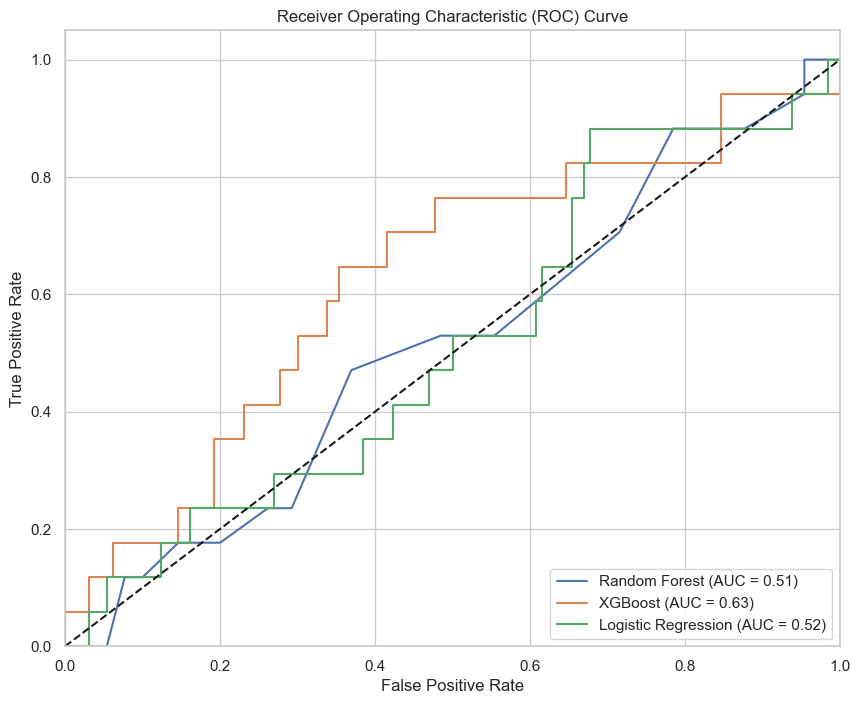

In [17]:
# Calculate ROC curves and AUCs
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_model.predict_proba(x_test)[:,1])
xgb_fpr, xgb_tpr, _ = roc_curve(y_test, xgb_model.predict_proba(x_test)[:,1])
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_model.predict_proba(x_test)[:,1])

# Plot ROC curves
plt.figure(figsize=(10, 8))
plt.plot(rf_fpr, rf_tpr, label=f"Random Forest (AUC = {auc(rf_fpr, rf_tpr):.2f})")
plt.plot(xgb_fpr, xgb_tpr, label=f"XGBoost (AUC = {auc(xgb_fpr, xgb_tpr):.2f})")
plt.plot(lr_fpr, lr_tpr, label=f"Logistic Regression (AUC = {auc(lr_fpr, lr_tpr):.2f})")
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [18]:
import shap

# For XGBoost
# Initialize the SHAP explainer
explainer_xgb = shap.TreeExplainer(xgb_model)
# Calculate SHAP values
shap_values_xgb = explainer_xgb.shap_values(x_test)

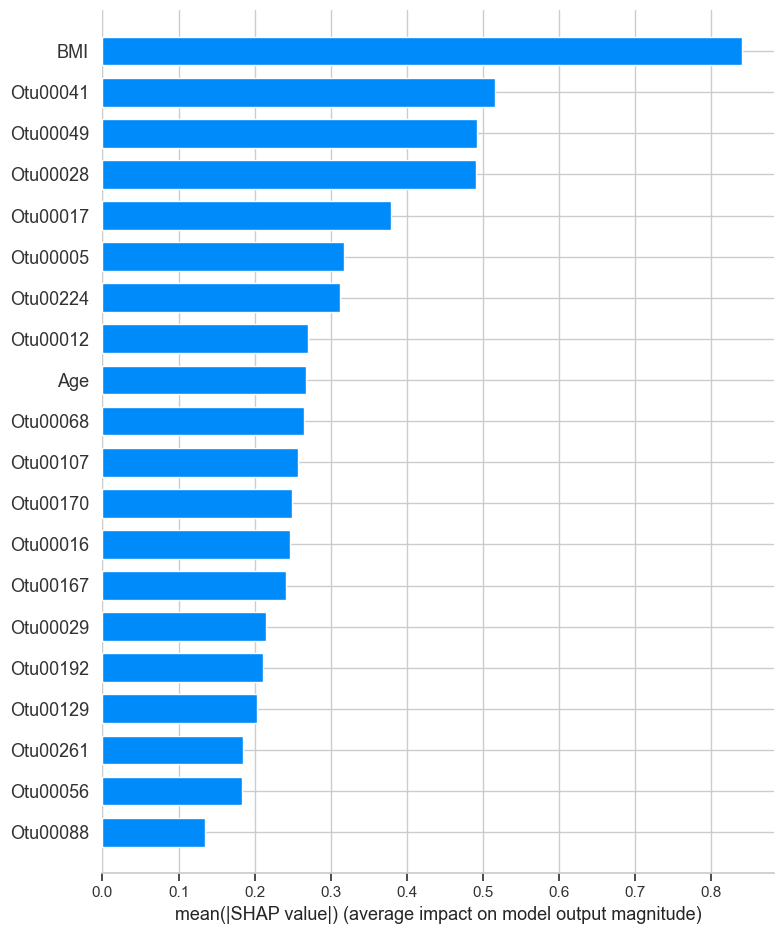

In [19]:
shap.summary_plot(shap_values_xgb, x_test, plot_type="bar", feature_names=x.columns)

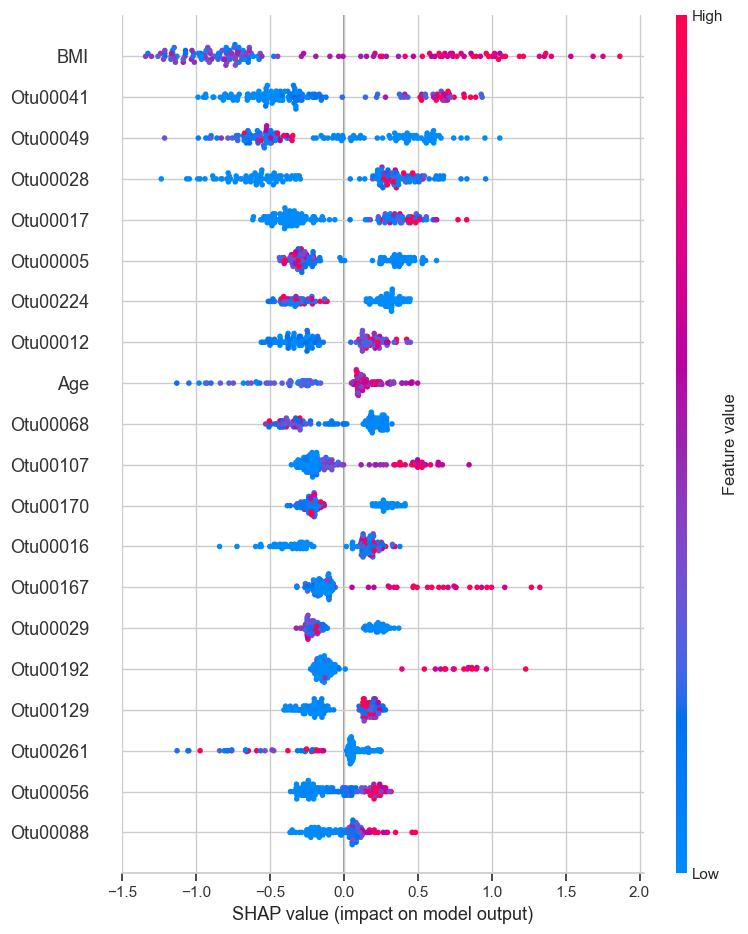

In [20]:
shap.summary_plot(shap_values_xgb, x_test, feature_names=x.columns)

In [21]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV

In [22]:
# Parameter grids for each model
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

xgb_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6, 9],
    # 'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8, 1]
}

lgbm_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [-1, 10, 20, 30],
    # 'learning_rate': [0.01, 0.1, 0.2],
    'num_leaves': [31, 50, 100],
    'min_child_samples': [20, 40, 60]
}

lr_param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['newton-cg', 'lbfgs', 'liblinear']
}

In [24]:
# Initialize the models
rf_model = RandomForestClassifier(random_state=42)
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
lgbm_model = LGBMClassifier(random_state=42)
lr_model = LogisticRegression(random_state=42, max_iter=1000)

# Set up Grid Search for each model
rf_grid_search = GridSearchCV(estimator=rf_model, param_grid=rf_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
xgb_grid_search = GridSearchCV(estimator=xgb_model, param_grid=xgb_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
lgbm_grid_search = GridSearchCV(estimator=lgbm_model, param_grid=lgbm_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
lr_grid_search = GridSearchCV(estimator=lr_model, param_grid=lr_param_grid, cv=5, scoring='accuracy', n_jobs=-1)

In [25]:
# Train the models using Grid Search
rf_grid_search.fit(x_train, y_train)
xgb_grid_search.fit(x_train, y_train)
lgbm_grid_search.fit(x_train, y_train)
# lr_grid_search.fit(x_train, y_train)

/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [12:48:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [12:48:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [12:48:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [12:48:58] WARNING: /Users/runner/work/xgboost/xgboost/src

[LightGBM] [Info] Number of positive: 33, number of negative: 242[LightGBM] [Info] Number of positive: 33, number of negative: 241

[LightGBM] [Info] Number of positive: 33, number of negative: 241
[LightGBM] [Info] Number of positive: 33, number of negative: 242
[LightGBM] [Info] Number of positive: 32, number of negative: 242
[LightGBM] [Info] Number of positive: 33, number of negative: 241
[LightGBM] [Info] Number of positive: 33, number of negative: 241
[LightGBM] [Info] Number of positive: 32, number of negative: 242
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.105716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 10619
[LightGBM] [Info] Number of data points in the train set: 274, number of used features: 668
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.120438 -> initscore=-1.988289
[LightGBM] [Info] Start training from s

/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 41, number of negative: 302
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12710
[LightGBM] [Info] Number of data points in the train set: 343, number of used features: 749
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.119534 -> initscore=-1.996855
[LightGBM] [Info] Start training from score -1.996855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

GridSearchCV(cv=5, estimator=LGBMClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [-1, 10, 20, 30],
                         'min_child_samples': [20, 40, 60],
                         'n_estimators': [100, 200, 300],
                         'num_leaves': [31, 50, 100]},
             scoring='accuracy')

In [26]:
# Get the best models
best_rf_model = rf_grid_search.best_estimator_
best_xgb_model = xgb_grid_search.best_estimator_
best_lgbm_model = lgbm_grid_search.best_estimator_
# best_lr_model = lr_grid_search.best_estimator_

In [28]:
lr_model.fit(x_train, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In [29]:
# Predictions using the best models
rf_pred = best_rf_model.predict(x_test)
xgb_pred = best_xgb_model.predict(x_test)
lgbm_pred = best_lgbm_model.predict(x_test)
lr_pred = lr_model.predict(x_test)

In [30]:
# Calculate accuracy metrics
metrics = {
    'Model': ['Random Forest', 'XGBoost', 'LightGBM', 'Logistic Regression'],
    'Accuracy': [
        accuracy_score(y_test, rf_pred),
        accuracy_score(y_test, xgb_pred),
        accuracy_score(y_test, lgbm_pred),
        accuracy_score(y_test, lr_pred)
    ],
    'Precision': [
        precision_score(y_test, rf_pred),
        precision_score(y_test, xgb_pred),
        precision_score(y_test, lgbm_pred),
        precision_score(y_test, lr_pred)
    ],
    'Recall': [
        recall_score(y_test, rf_pred),
        recall_score(y_test, xgb_pred),
        recall_score(y_test, lgbm_pred),
        recall_score(y_test, lr_pred)
    ],
    'F1 Score': [
        f1_score(y_test, rf_pred),
        f1_score(y_test, xgb_pred),
        f1_score(y_test, lgbm_pred),
        f1_score(y_test, lr_pred)
    ],
    'AUC': [
        roc_auc_score(y_test, rf_pred),
        roc_auc_score(y_test, xgb_pred),
        roc_auc_score(y_test, lgbm_pred),
        roc_auc_score(y_test, lr_pred)
    ]
}

# Convert the metrics dictionary to a DataFrame for easy viewing
metrics_df = pd.DataFrame(metrics)
metrics_df

/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Model,Accuracy,Precision,Recall,F1 Score,AUC
0,Random Forest,0.884354,0.000000,0.000000,0.000000,0.500000
1,XGBoost,0.877551,0.333333,0.058824,0.100000,0.521719
2,LightGBM,0.891156,1.000000,0.058824,0.111111,0.529412
3,Logistic Regression,0.768707,0.130435,0.176471,0.150000,0.511312


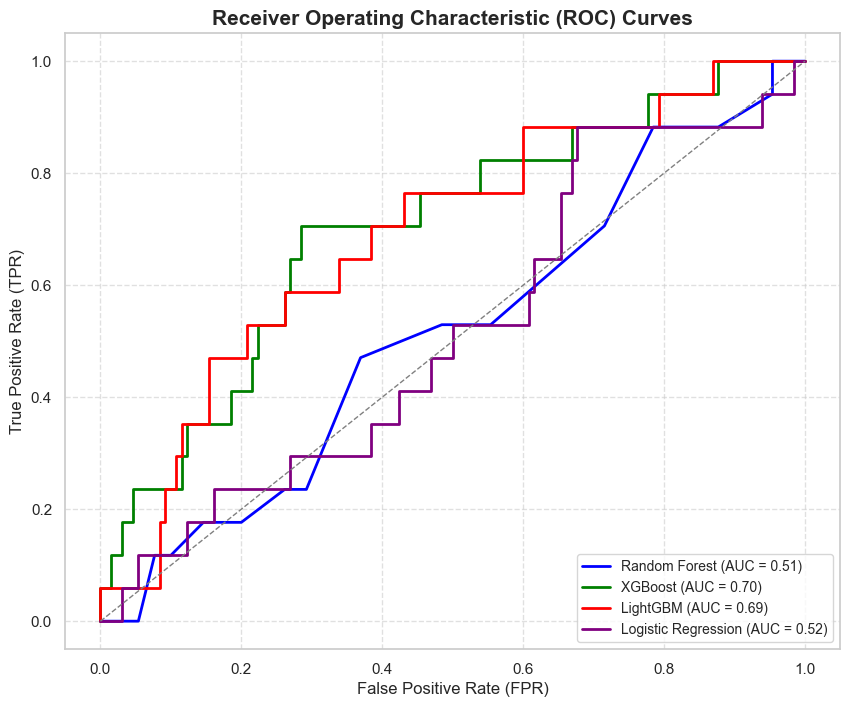

In [32]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Calculate ROC curves and AUCs
rf_fpr, rf_tpr, _ = roc_curve(y_test, best_rf_model.predict_proba(x_test)[:, 1])
xgb_fpr, xgb_tpr, _ = roc_curve(y_test, best_xgb_model.predict_proba(x_test)[:, 1])
lgbm_fpr, lgbm_tpr, _ = roc_curve(y_test, best_lgbm_model.predict_proba(x_test)[:, 1])
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_model.predict_proba(x_test)[:, 1])

# Calculate AUC scores
rf_auc = auc(rf_fpr, rf_tpr)
xgb_auc = auc(xgb_fpr, xgb_tpr)
lgbm_auc = auc(lgbm_fpr, lgbm_tpr)
lr_auc = auc(lr_fpr, lr_tpr)

# Plotting the ROC curves with enhanced aesthetics
plt.figure(figsize=(10, 8))
plt.plot(rf_fpr, rf_tpr, linestyle='-', color='blue', label=f'Random Forest (AUC = {rf_auc:.2f})', linewidth=2)
plt.plot(xgb_fpr, xgb_tpr, linestyle='-', color='green', label=f'XGBoost (AUC = {xgb_auc:.2f})', linewidth=2)
plt.plot(lgbm_fpr, lgbm_tpr, linestyle='-', color='red', label=f'LightGBM (AUC = {lgbm_auc:.2f})', linewidth=2)
plt.plot(lr_fpr, lr_tpr, linestyle='-', color='purple', label=f'Logistic Regression (AUC = {lr_auc:.2f})', linewidth=2)

# Plotting the random chance line
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', linewidth=1)

# Enhancing plot with titles and labels
plt.title('Receiver Operating Characteristic (ROC) Curves', fontsize=15, weight='bold')
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.legend(loc='lower right', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)

# Adding some style
plt.style.use('ggplot')

plt.show()

In [33]:
# For XGBoost
# Initialize the SHAP explainer
best_explainer_xgb = shap.TreeExplainer(best_xgb_model)
# Calculate SHAP values
best_shap_values_xgb = best_explainer_xgb.shap_values(x_test)

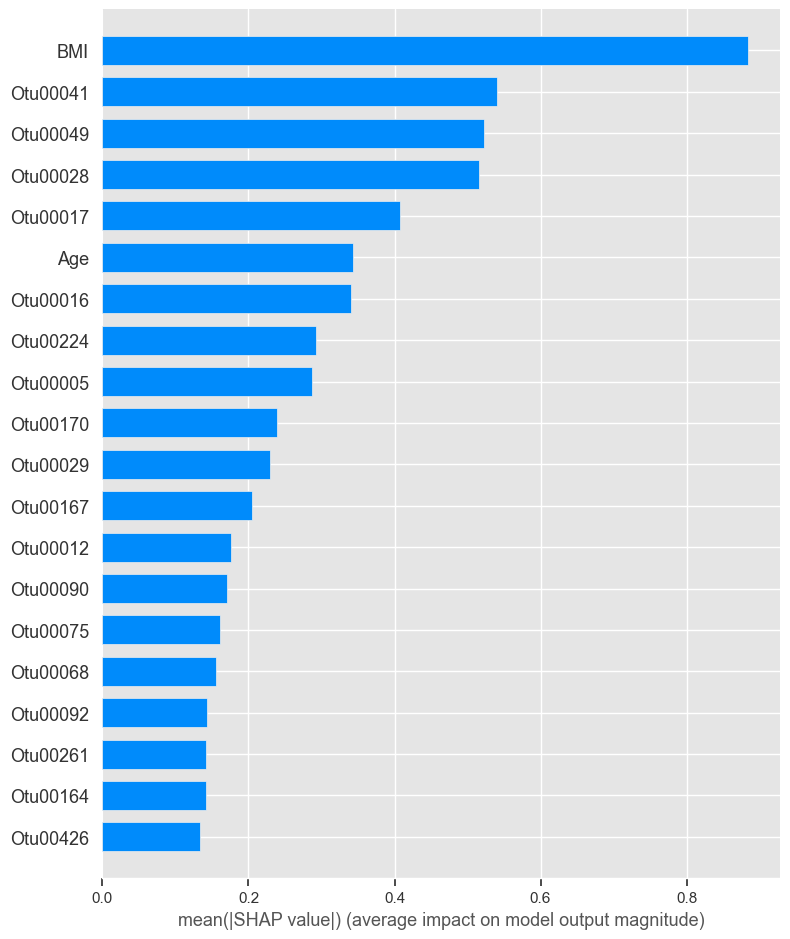

In [34]:
shap.summary_plot(best_shap_values_xgb, x_test, plot_type="bar", feature_names=x.columns)

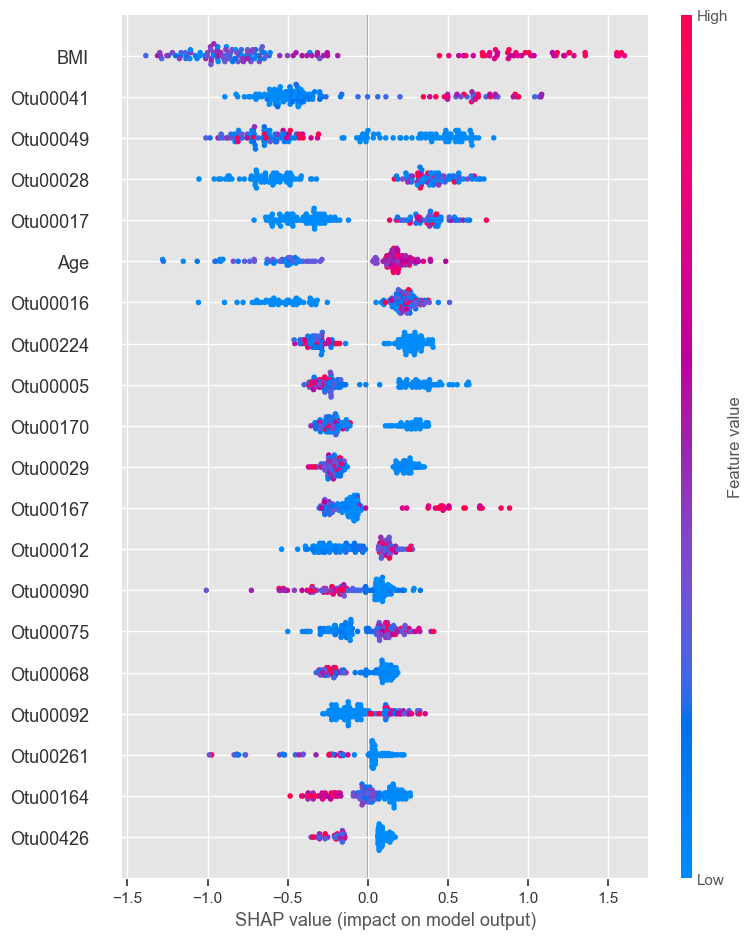

In [35]:
shap.summary_plot(best_shap_values_xgb, x_test, feature_names=x.columns)

In [37]:
x_test.shape

(147, 6924)